In [131]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import random as rd

In [179]:
def read_img(path):
    img = Image.open(path)
    return np.round(np.array(img.resize((15, 20))) / 255)

def convert_img(img):
    for i in range(len(img)):
        for j in range(len(img[i])):
            if sum(img[i][j]) == 1 or sum(img[i][j]) == 2:
                img[i][j] = np.array([0., 0., 0.])

def to_2D_matrix(img):
    matrix = []
    for i in img:
        array = []
        for j in i:
            array.append(j[0])
        matrix.append(array)
    return np.asarray(matrix)
          
def to_matrix(path):
    img = read_img(path)
    convert_img(img)
    return to_2D_matrix(img)

In [182]:
def shingling(img):
    k = 5
    s = []
    for i in range(img.shape[0] - k):
        for j in range(img.shape[1] - k):
            img_pc = img[i:i+k, j:j+k].flatten()
            s.append(str(img_pc))
    return s

In [ ]:
def bool_matrix():

In [256]:
images = []
all_shingles = []
for i in os.listdir('test'):
    name = i
    matrix = to_matrix('/Users/zhezhou/Downloads/test/'+i)
    shingles = shingling(matrix)
    images.append((name, shingles))
    all_shingles += shingles
    all_shingles = list(set(all_shingles))
    
matrix = []
for i in images:
    name = i[0]
    shingles = i[1]
    col = []
    for j in all_shingles:
        if j in shingles:
            col.append(1)
        else:
            col.append(0)
    matrix.append(col)
matrix = np.transpose(np.asarray(matrix))

In [169]:
def minHash(matrix):
    row = matrix.shape[0]
    col = matrix.shape[1]
    num = 100
    perm = list(range(row))
    sig = np.zeros([num, col])

    for n in range(num):
        rd.shuffle(perm)
        for i in range(col):
            v = 1
            for j in perm:
                if matrix[j, i] == 1:
                    sig[n, i] = v
                    break
                else:
                    v += 1

    return sig

In [171]:
sign = minHash(matrix)

In [176]:
col = []
for i in range(num):
    col.append()

array([[297., 163., 114., ...,  35.,  35., 209.],
       [237., 318.,  29., ...,  25., 105., 244.],
       [111., 108.,   8., ..., 191., 139., 108.],
       ...,
       [ 14.,  49.,  99., ..., 104., 104., 191.],
       [ 56.,  76., 108., ..., 435., 167., 207.],
       [877., 182.,   2., ..., 126., 126., 121.]])

In [136]:
INT_MAX = 99999
np.zeros([2, 1]) + INT_MAX

array([[99999.],
       [99999.]])

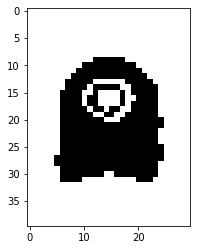

In [289]:
img = Image.open('1656.jpg')
img = np.round(np.array(img.resize((30, 40))) / 255)
convert_img(img)
plt.imshow(img)

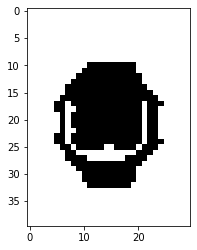

In [291]:
img = Image.open('4705.jpg')
img = np.round(np.array(img.resize((30, 40))) / 255)
convert_img(img)
plt.imshow(img)

In [178]:
# 缺点
    round会带来较大的误差，手臂会被认为白色
    像素点少，计算快，正确率高
    应该有跟便捷的算法
    浅色的衣服，或者带有白色的物件pattern会被影响

IndentationError: unexpected indent (<ipython-input-178-e0e0e9c94939>, line 2)

In [196]:
a = np.matrix('1 2 3; 4 5 6')
a = a.T
for i in a[:]
    print(i[0])

[[1 4]]
[[2 5]]
[[3 6]]


In [152]:
for i in range(600000000):
    if i / 2 == 0:
        j = 1
    

In [166]:
len(matrix[1])

434

array([163., 318., 108.,  10., 110.,   5.,  83.,  70.,  20., 343.,  73.,
         9., 159.,  36.,  63., 252.,  81., 114.,  56., 113., 173., 112.,
        70., 143.,   1.,  22.,  30.,  31., 227.,  17.,  24.,  96., 283.,
        45., 298., 191.,  41.,  52.,  30.,  41.,  38.,   8.,  29., 453.,
        68.,  85.,  26.,  44., 116.,  81.,   7.,  75., 157., 171.,   8.,
       295., 391., 161., 156.,  64., 187.,  96.,   8., 120.,  29.,  19.,
        15.,  14.,  27.,  92., 119.,  10., 125., 508., 588., 836.,  75.,
       195.,  64., 182., 439.,  92., 115.,  47., 171., 135., 326.,   8.,
       170.,  21., 565., 163.,  71.,   9., 179.,  13., 275.,  49.,  76.,
       182.])

In [ ]:
def split(l, p):
    n = int(len(l) / p)
    length_to_split = []
    for i in range(0, p - 1):
        length_to_split.append(n)
    length_to_split.append(len(l) - n * (p-1))
    l = iter(l)
    return [list(islice(l, e)) for e in length_to_split]

In [217]:
array = np.split(sign[:, 1], 10)
x = array[1]
y = array[2]
np.array_equal(x, y)

False

In [235]:
def LSH(sig, band):
    given = np.split(sig[:, 0], band)
    candidates = []
    for i in range(1, sig.shape[1]):
        col = np.split(sig[:, i], band)
        for j in range(band):
            if np.array_equal(given[j], col[j]):
                candidates.append(i)
                print('ok')
                break
    return candidates

In [236]:
np.split(sign[:, 0], 25)[10]

array([  1., 326., 150., 404.])

In [240]:
LSH(sign, 25)

[]

In [270]:
for i in np.array_split(np.array(os.listdir('test')), 10)[5]:
    print(i)

2141.jpg
2169.jpg
2196.jpg
2182.jpg
2357.jpg
1886.jpg
1892.jpg
2343.jpg
1845.jpg
1879.jpg
2223.jpg
2237.jpg
1931.jpg
1925.jpg
1919.jpg
2035.jpg
2009.jpg
2008.jpg
2034.jpg
1918.jpg
1924.jpg
1930.jpg
2222.jpg
2342.jpg
1887.jpg
2356.jpg
2183.jpg
2197.jpg
2168.jpg
2140.jpg
2154.jpg
2150.jpg
2144.jpg
2193.jpg
2187.jpg
1883.jpg
1897.jpg
2346.jpg
1868.jpg
1854.jpg
2226.jpg
2232.jpg
1934.jpg


In [252]:
len(np.array(os.listdir('test')))

434

In [278]:
for i in np.array_split(np.array(os.listdir('test')), 10)[2]:
    print(i)
    break

2177.jpg


In [279]:
x = ['x', 'y']
'xx' + x

TypeError: can only concatenate str (not "list") to str

In [ ]:
一张鞋子
一个包

In [281]:
pwd = '/Users/zhezhou/Downloads/test/'
img_names = np.array(os.listdir(pwd))
# Find All Shingles
imgs = []
all_shingles = []
for i in np.array_split(img_names, 5)[2]:
    name = i
    mat = to_matrix(pwd + i)
    # Calculate Shingles
    shingles = shingling(mat)
    imgs.append((name, shingles))
    # Add Shingles
    all_shingles += shingles
    # Delete Duplicate Shingles
    all_shingles = list(set(all_shingles))
# Calculates Boolean Matrices

In [282]:
imgs

[('1917.jpg',
  ['[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1.]',
   '[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1.]',
   '[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.\n 1. 1. 1. 1.]',
   '[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

In [ ]:
x = 